In [1]:
import numpy as np
import matplotlib.pyplot as plt
import skimage
import seaborn as sns

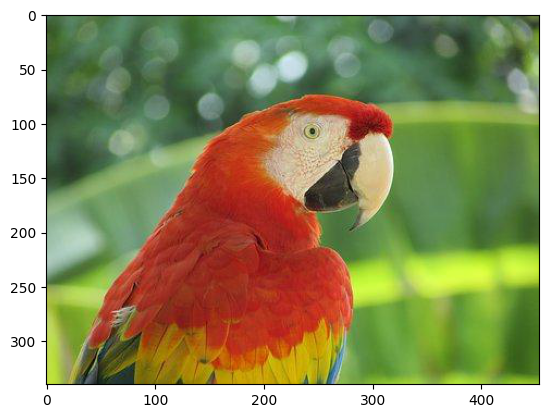

In [2]:
parrot = plt.imread("parrot.png")
plt.imshow(parrot)

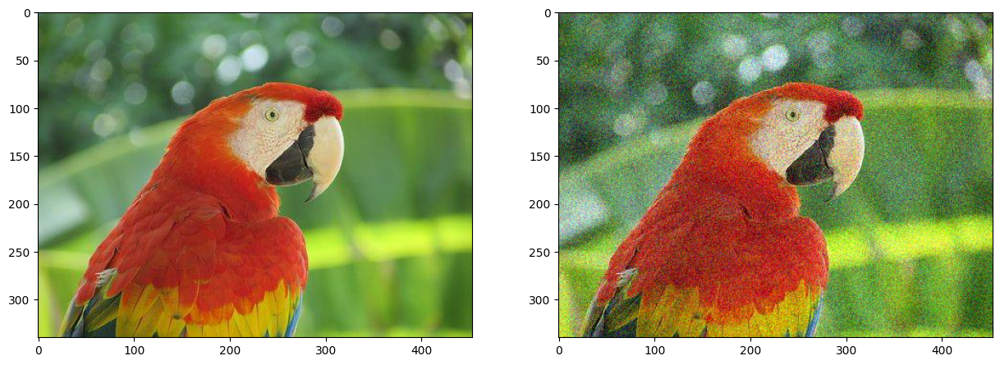

In [3]:
parrot_gaus_noise = skimage.util.random_noise(parrot, mode="gaussian", rng=True)

plt.figure(figsize=(15, 10))
plt.subplot(121)
plt.imshow(parrot)
plt.subplot(122)
plt.imshow(parrot_gaus_noise)

In [4]:
def Grayscale(img):
    R = np.array(img[:, :, 0].astype(np.float32))
    G = np.array(img[:, :, 1].astype(np.float32))
    B = np.array(img[:, :, 2].astype(np.float32))
    return np.array((R+G+B) / 3)

<Axes: ylabel='Count'>

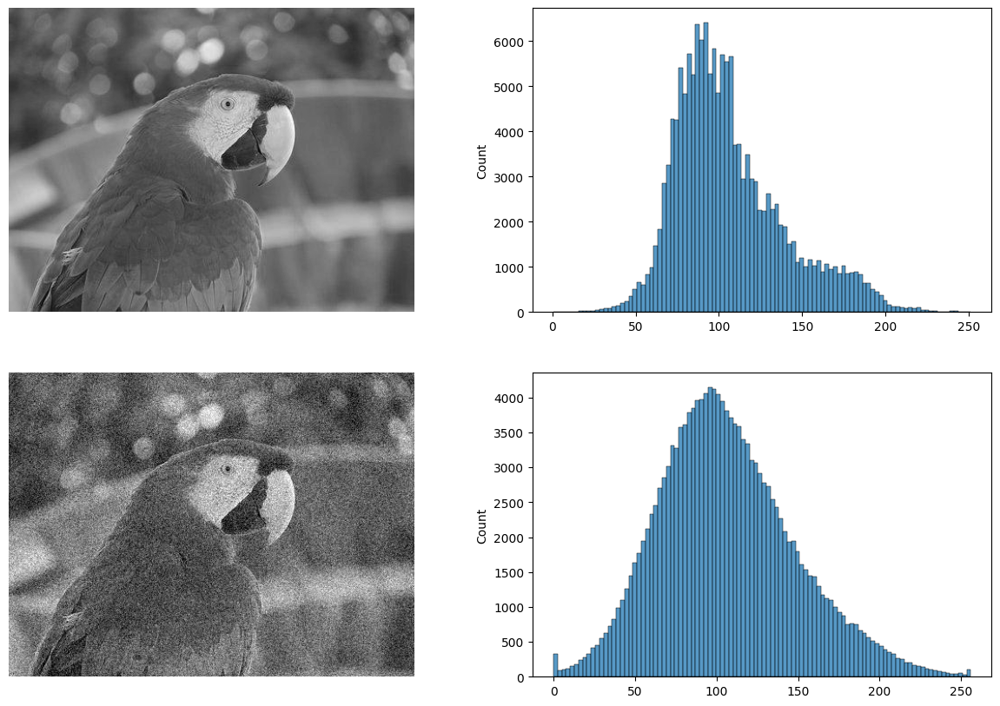

In [5]:
parrot_gr = Grayscale(parrot)
parrot_gr_noise_gauss = skimage.util.random_noise(parrot_gr, mode="gaussian", rng=None)

plt.figure(figsize=(15, 10))

plt.subplot(221)
plt.imshow(parrot_gr, cmap="gray")
plt.axis('off')

plt.subplot(222)
sns.histplot((parrot_gr*256).ravel(), bins=100)

plt.subplot(223)
plt.imshow(parrot_gr_noise_gauss, cmap="gray")
plt.axis('off')

plt.subplot(224)
sns.histplot((parrot_gr_noise_gauss*256).ravel(), bins=100)

<Axes: ylabel='Count'>

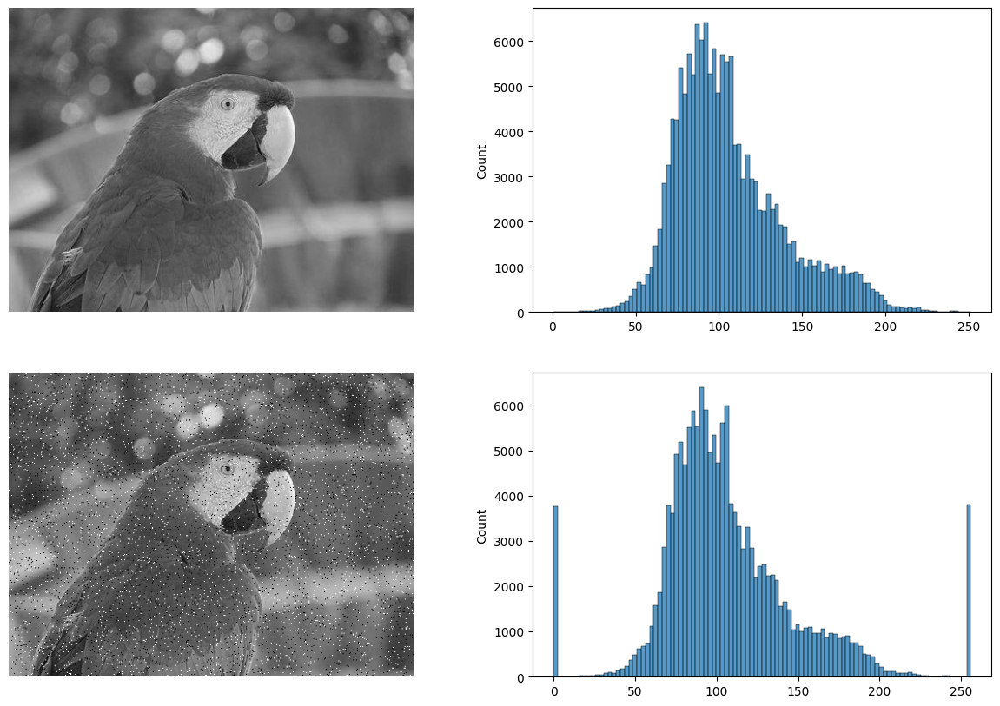

In [6]:
parrot_gr = Grayscale(parrot)
parrot_gr_noise_sp = skimage.util.random_noise(parrot_gr, mode="s&p", rng=None)

plt.figure(figsize=(15, 10))

plt.subplot(221)
plt.imshow(parrot_gr, cmap="gray")
plt.axis('off')

plt.subplot(222)
sns.histplot((parrot_gr*256).ravel(), bins=100)

plt.subplot(223)
plt.imshow(parrot_gr_noise_sp, cmap="gray")
plt.axis('off')

plt.subplot(224)
sns.histplot((parrot_gr_noise_sp*256).ravel(), bins=100)

In [7]:
def Mirror_Padding_v2(img, nx, ny):
    height, width = img.shape
    height_new = height + 2*nx
    width_new = width + 2*ny
    output = np.zeros([height_new, width_new])
    # Center
    output[nx:height_new-nx, ny:width_new-ny] = img
    # Top and Bottom
    output[:nx, ny:width_new-ny] = img[nx-1::-1, :] # Top
    output[height+nx:, ny:width_new-ny] = img[height-1:height-nx-1:-1, :] # Bottom
    # Left and Right
    output[:height_new, :ny] = output[:, 2*ny:ny:-1] # Left
    output[:height_new, width_new-ny:width_new] = output[:, width_new-ny-1:width_new-2*ny-1:-1] # Right
    return output

def Zero_Padding_v2(img, size):
    height, width = img.shape
    height_new = height + 2*size[0]
    width_new = width + 2*size[1]
    output = np.zeros([height_new, width_new])
    output[size[0]:height_new-size[0], size[1]:width_new-size[1]] = img
    return output


def box_filter(img, size):
    img = Mirror_Padding_v2(img, size[0], size[1])
    m, n = img.shape
    output = np.zeros([m, n])
    for x in range(size[0], m-size[0]):
        for y in range(size[1], n-size[1]):
            region = img[x-size[0]//2 : x+size[0]//2+1, y-size[1]//2 : y+size[1]//2+1]
            output[x, y] = np.sum(region)/(size[0]*size[1])
    return output[size[0]:m-size[0], size[1]:n-size[1]]

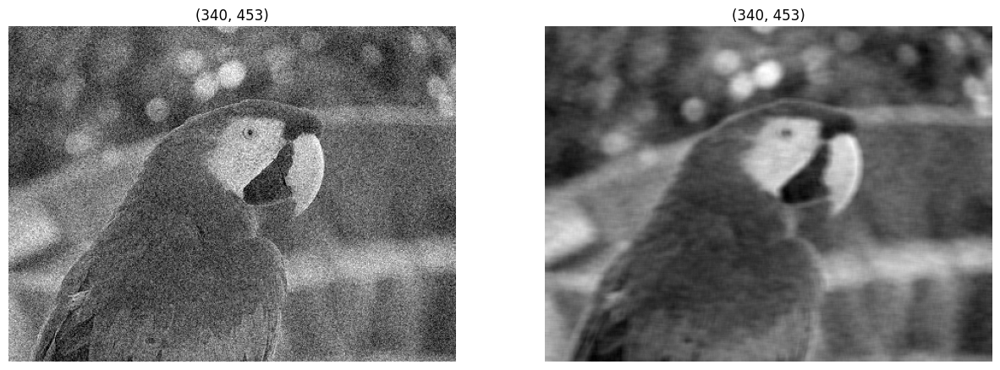

In [8]:
parrot_smooth = box_filter(parrot_gr_noise_gauss, size=(4, 9))

plt.figure(figsize=(15, 10))

plt.subplot(121)
plt.imshow(parrot_gr_noise_gauss, cmap="gray")
plt.title(parrot_gr_noise_gauss.shape)
plt.axis('off')

plt.subplot(122)
plt.imshow(parrot_smooth, cmap="gray")
plt.title(parrot_smooth.shape)
plt.axis('off')

plt.show()

In [9]:
def geometric_mean_filter(img, size):
    img = Mirror_Padding_v2(img, size[0], size[1])
    m, n = img.shape
    output = np.zeros([m, n])
    for x in range(size[0], m-size[0]):
        for y in range(size[1], n-size[1]):
            elements = img[x-size[0]//2:x+size[0]//2+1, y-size[1]//2:y+size[1]//2+1]
            fxy = np.prod(elements+1) # Plus one because has value pixel 0
            output[x, y] = np.power(fxy, 1.0/(size[0]*size[1]))
    return output[size[0]:m-size[0], size[1]:n-size[1]]

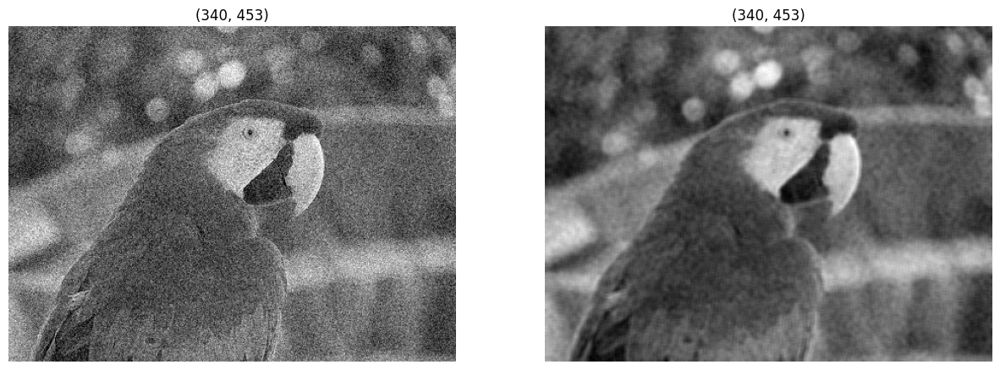

In [10]:
parrot_smooth_2 = geometric_mean_filter(parrot_gr_noise_gauss, size=(5, 5))

plt.figure(figsize=(15, 10))

plt.subplot(121)
plt.imshow(parrot_gr_noise_gauss, cmap="gray")
plt.title(parrot_gr_noise_gauss.shape)
plt.axis('off')

plt.subplot(122)
plt.imshow(parrot_smooth_2, cmap="gray")
plt.title(parrot_smooth_2.shape)
plt.axis('off')

plt.show()

In [11]:
def harmnoic_filter_v2(img, size):
    img = Mirror_Padding_v2(img, size[0], size[1])
    m, n = img.shape
    output = np.zeros([m, n])
    for x in range(size[0], m-size[0]):
        for y in range(size[1], n-size[1]):
            temp = img[x-size[0]//2:x+size[0]//2+1, y-size[1]//2:y+size[1]//2+1]
            output[x, y] = (size[0]*size[1]) / np.sum(1/temp)
    return output[size[0]:m-size[0], size[1]:n-size[1]]

In [12]:
def hamonic_filter(img, size):
    img = Zero_Padding_v2(img, size)
    m,n = img.shape
    output = np.zeros([m, n])
    for x in range(0, m-size[0]):
        for y in range(0, n-size[1]):
            region = img[x:x+size[0], y:y+size[1]]
            inv_val = lambda val : 1/(val+1)
            mask2 = inv_val(region)
            output[x, y] = size[0]*size[1]/mask2.sum()
    return output[size[0]:m-2*size[0], size[1]:n-2*size[1]]

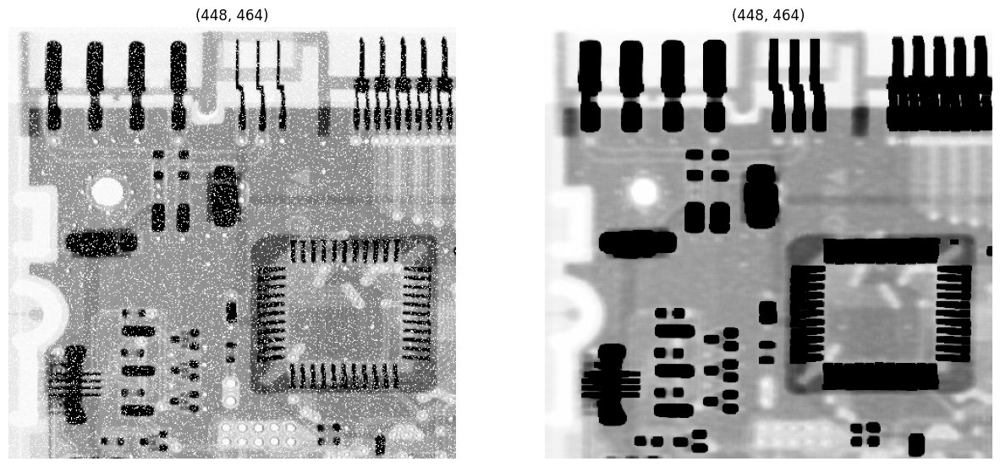

In [13]:
np.seterr(divide = 'ignore') 
img2 = plt.imread("circuit-board-salt-prob-pt1.tif")
img2_hamonic = harmnoic_filter_v2(img2, size=(4, 9))

plt.figure(figsize=(15, 10))

plt.subplot(121)
plt.imshow(img2, cmap="gray")
plt.title(img2.shape)
plt.axis('off')

plt.subplot(122)
plt.imshow(img2_hamonic, cmap="gray")
plt.title(img2_hamonic.shape)
plt.axis('off')

plt.show()

In [14]:
def contraharmonic_mean(img, size, Q):
    img = Mirror_Padding_v2(img, size[0], size[1])
    m, n = img.shape
    output = np.zeros([m, n])
    for x in range(size[0], m-size[0]):
        for y in range(size[1], n-size[1]):
            elements = img[x-size[0]//2:x+size[0]//2+1, y-size[1]//2:y+size[1]//2+1]
            fxy = np.sum((elements+1))**(Q+1) / np.sum((elements+1))**(Q)
            output[x,y] = fxy
    return output[size[0]:m-size[0], size[1]:n-size[1]]

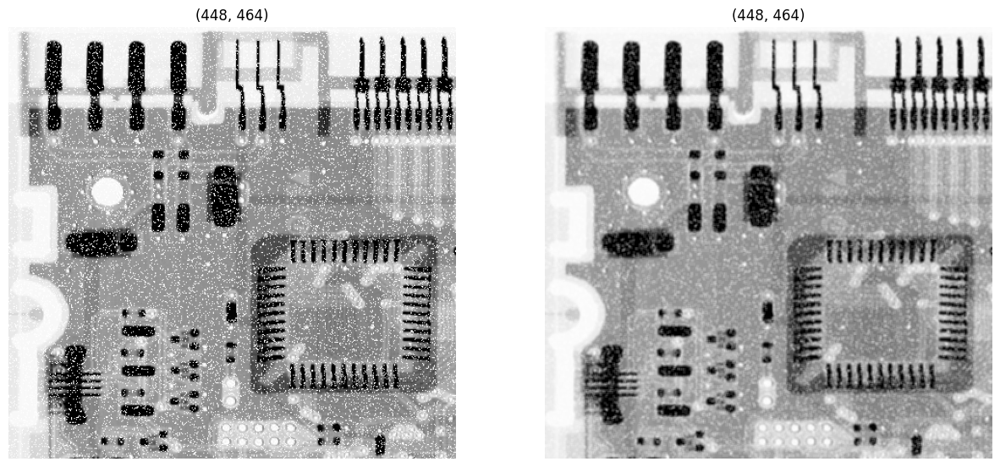

In [15]:
img2_hamonic_2 = contraharmonic_mean(img2, size=(3, 3), Q=1.5)

plt.figure(figsize=(15, 10))

plt.subplot(121)
plt.imshow(img2, cmap="gray")
plt.title(img2.shape)
plt.axis('off')

plt.subplot(122)
plt.imshow(img2_hamonic_2, cmap="gray")
plt.title(img2_hamonic_2.shape)
plt.axis('off')

plt.show()

In [16]:
def GaussFunc(K, sigma, s, t):
    return K*np.exp(-0.5*(np.sqrt(s**2 + t**2))**2 / sigma**2)

def Gauss_Filter(img, size, K, sigma):
    # Create matrix Gauss
    x_axis = np.arange(size[0]//2+1)
    y_axis = np.arange(size[1]//2+1)
    matrix_gauss = np.zeros([size[0], size[1]])
    for y in range(0, size[0]):
        for x in range(0, size[1]):
            value = GaussFunc(K, sigma, x_axis[np.abs(size[0]//2-x)], y_axis[np.abs(size[1]//2-y)])
            matrix_gauss[x, y] = value
    matrix_gauss = 1/np.sum(matrix_gauss) * matrix_gauss
    # Create matrix Gauss
    img = Mirror_Padding_v2(img, size[0], size[1])
    m, n = img.shape
    output = np.zeros([m ,n])
    for x in range(size[0], m-size[0]):
        for y in range(size[1], n-size[1]):
            elements = img[x-size[0]//2:x+size[0]//2+1, y-size[1]//2:y+size[1]//2+1]
            fxy = elements*matrix_gauss
            output[x,y] = np.sum(fxy)
    return output[size[0]:m-size[0], size[1]:n-size[1]]

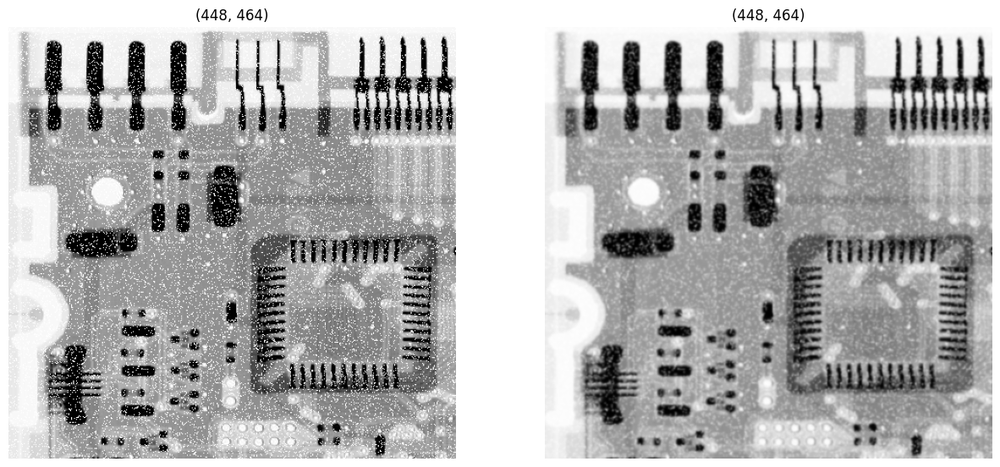

In [17]:
img2_hamonic_3 = Gauss_Filter(img2, size=(7, 7), K=2, sigma=1)

plt.figure(figsize=(15, 10))

plt.subplot(121)
plt.imshow(img2, cmap="gray")
plt.title(img2.shape)
plt.axis('off')

plt.subplot(122)
plt.imshow(img2_hamonic_3, cmap="gray")
plt.title(img2_hamonic_3.shape)
plt.axis('off')

plt.show()

In [18]:
def Median_Filter(img, size):
    img = Mirror_Padding_v2(img, size[0], size[1])
    m, n = img.shape
    output = np.zeros([m ,n])
    for x in range(size[0], m-size[0]):
        for y in range(size[1], n-size[1]):
            elements = img[x-size[0]//2:x+size[0]//2+1, y-size[1]//2:y+size[1]//2+1]
            output[x,y] = np.median(elements)
    return output[size[0]:m-size[0], size[1]:n-size[1]]

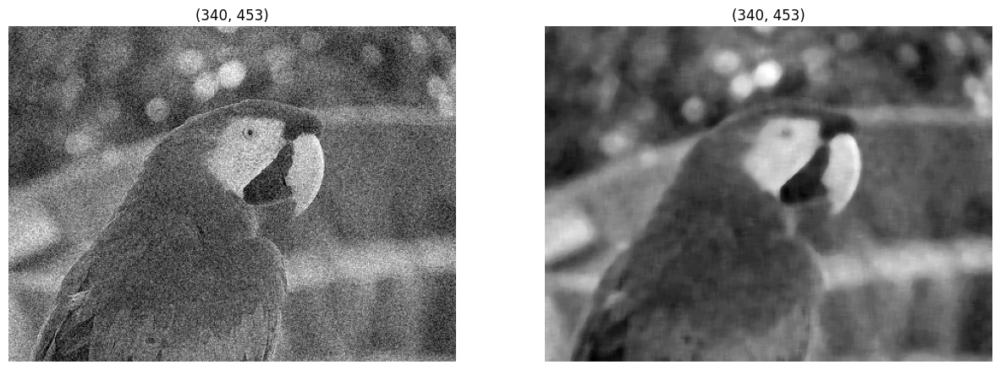

In [19]:
img2_hamonic_4 = Median_Filter(parrot_gr_noise_gauss, size=(8, 8))

plt.figure(figsize=(15, 10))

plt.subplot(121)
plt.imshow(parrot_gr_noise_gauss, cmap="gray")
plt.title(parrot_gr_noise_gauss.shape)
plt.axis('off')

plt.subplot(122)
plt.imshow(img2_hamonic_4, cmap="gray")
plt.title(img2_hamonic_4.shape)
plt.axis('off')

plt.show()

In [20]:
def Max_Filter(img, size):
    img = Mirror_Padding_v2(img, size[0], size[1])
    m, n = img.shape
    output = np.zeros([m ,n])
    for x in range(size[0], m-size[0]):
        for y in range(size[1], n-size[1]):
            elements = img[x-size[0]//2:x+size[0]//2+1, y-size[1]//2:y+size[1]//2+1]
            output[x,y] = np.max(elements)
    return output[size[0]:m-size[0], size[1]:n-size[1]]

def Min_Filter(img, size):
    img = Mirror_Padding_v2(img, size[0], size[1])
    m, n = img.shape
    output = np.zeros([m ,n])
    for x in range(size[0], m-size[0]):
        for y in range(size[1], n-size[1]):
            elements = img[x-size[0]//2:x+size[0]//2+1, y-size[1]//2:y+size[1]//2+1]
            output[x,y] = np.min(elements)
    return output[size[0]:m-size[0], size[1]:n-size[1]]

def MidPoint_Filter(img, size):
    img = Mirror_Padding_v2(img, size[0], size[1])
    m, n = img.shape
    output = np.zeros([m ,n])
    for x in range(size[0], m-size[0]):
        for y in range(size[1], n-size[1]):
            elements = img[x-size[0]//2:x+size[0]//2+1, y-size[1]//2:y+size[1]//2+1]
            max_value = np.max(elements)
            min_value = np.min(elements)
            output[x,y] = 0.5*(max_value + min_value)
    return output[size[0]:m-size[0], size[1]:n-size[1]]

(-0.5, 463.5, 447.5, -0.5)

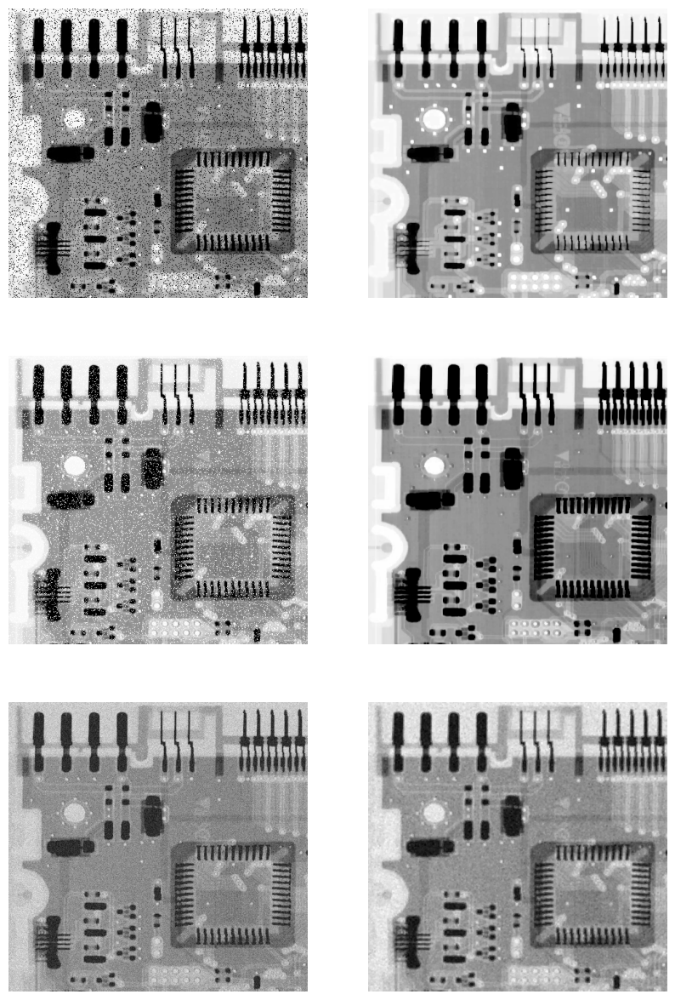

In [21]:
board_peper = plt.imread("circuit-board-pepper-prob-pt1.tif")
board_salt = plt.imread("circuit-board-salt-prob-pt1.tif")
board_gauss = plt.imread("ckt-board-gauss-var-400.tif")

plt.figure(figsize=(10, 15))

plt.subplot(321)
plt.imshow(board_peper, cmap='gray')
plt.axis('off')
plt.subplot(322)
plt.imshow(Max_Filter(board_peper, size=(3, 3)), cmap='gray')
plt.axis('off')

plt.subplot(323)
plt.imshow(board_salt, cmap='gray')
plt.axis('off')
plt.subplot(324)
plt.imshow(Min_Filter(board_salt, size=(3, 3)), cmap='gray')
plt.axis('off')

plt.subplot(325)
plt.imshow(board_gauss, cmap='gray')
plt.axis('off')
plt.subplot(326)
plt.imshow(MidPoint_Filter(board_gauss, size=(3, 3)), cmap='gray')
plt.axis('off')

(-0.5, 936.5, 931.5, -0.5)

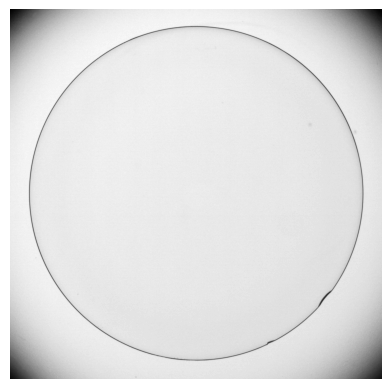

In [22]:
len = plt.imread("contact_lens_original.tif")
plt.imshow(len, cmap="gray")
plt.axis("off")

In [23]:
def Sobal_Filter(img, return_abs=False):
    # Get Constant metrices
    wx = np.array([[-1.0,-2.0,-1.0], [0.0,0.0,0.0], [1.0,2.0,1.0]])
    wy = np.array([[-1.0,0.0,1.0], [-2.0,0.0,2.0], [-1.0,0.0,1.0]])
    # Get Constant metrices
    img = Mirror_Padding_v2(img, 3, 3)
    m, n = img.shape
    output = np.zeros([m, n])
    for x in range(3, m-3):
        for y in range(3, n-3):
            elements = img[x-3//2:x+3//2+1, y-3//2:y+3//2+1]
            gx = np.sum(np.multiply(wx, elements))
            gy = np.sum(np.multiply(wy, elements))
            if return_abs == True:
                output[x, y] = np.abs(gx) + np.abs(gy)
            else:    
                output[x, y] = np.sqrt(gx**2 + gy**2)
    return output[3:m-3, 3:n-3]


In [24]:
len_sobel = Sobal_Filter(len, return_abs=True)

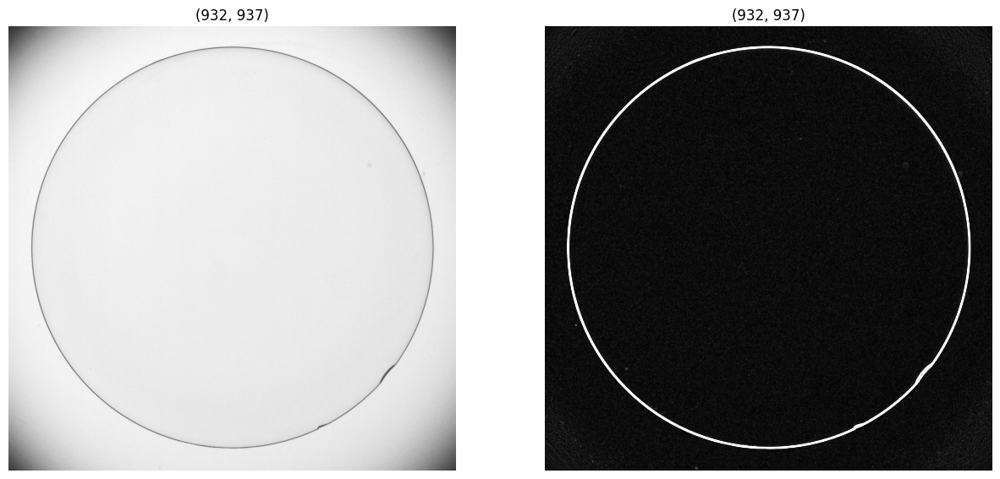

In [25]:

plt.figure(figsize=(15, 10))

plt.subplot(121)
plt.imshow(len, cmap="gray", vmin=0, vmax=256)
plt.title(len.shape)
plt.axis('off')

plt.subplot(122)
plt.imshow(len_sobel, cmap='gray', vmin=0, vmax=256)
plt.title(len_sobel.shape)
plt.axis('off')

plt.show()

In [26]:

def Laplace_Filter(img, H, return_Laplace=False):
    # Get Constant metrices
    Hn = np.array([[[0,1,0], [1,-4,1], [0,1,0]],
                 [[1,1,1], [1,-8,1], [1,1,1]],
                 [[0,-1,0], [-1,4,-1], [0,-1,0]],
                 [[-1,-1,-1], [-1,8,-1], [-1,-1,-1]]])
    cn = [-1, -1, 1, 1]
    H = H-1
    # Get Constant
    img = Mirror_Padding_v2(img, 3, 3)
    m, n = img.shape
    output = np.zeros([m, n])
    for x in range(3, m-3):
        for y in range(3, n-3):
            elements = img[x-3//2:x+3//2+1, y-3//2:y+3//2+1]
            value = np.multiply(cn[H]*Hn[H], elements)
            if return_Laplace == True:
                output = np.sum(value)
            else:
                output[x,y] = img[x, y] + np.sum(value)
    return output[3:m-3, 3:n-]
    
    

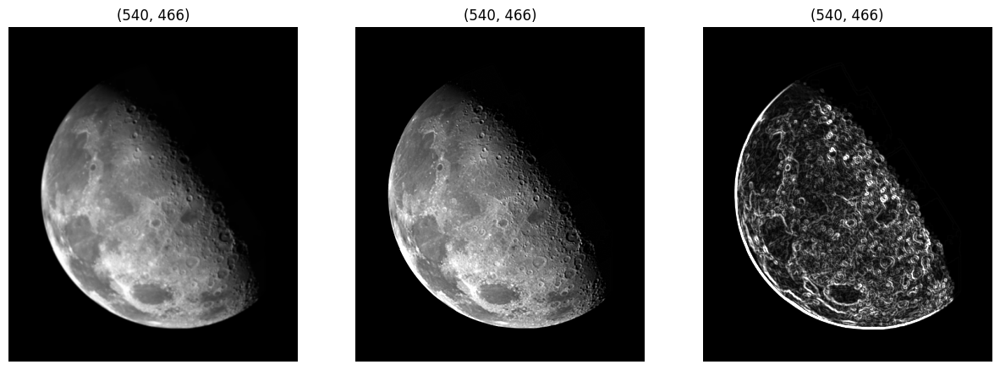

In [53]:
blur_moon = plt.imread("blurry_moon.tif")
moon_laplace = Laplace_Filter(blur_moon, H=1)
moon_sobel = Sobal_Filter(blur_moon, return_abs=True)

plt.figure(figsize=(15, 10))

plt.subplot(131)
plt.imshow(blur_moon, cmap="gray", vmin=0, vmax=256)
plt.title(blur_moon.shape)
plt.axis('off')

plt.subplot(132)
plt.imshow(moon_laplace, cmap='gray', vmin=0, vmax=256)
plt.title(moon_laplace.shape)
plt.axis('off')

plt.subplot(133)
plt.imshow(moon_sobel, cmap='gray', vmin=0, vmax=256)
plt.title(moon_sobel.shape)
plt.axis('off')

plt.show()

In [55]:
print(moon_sobel.max())

1070.0


<Axes: ylabel='Count'>

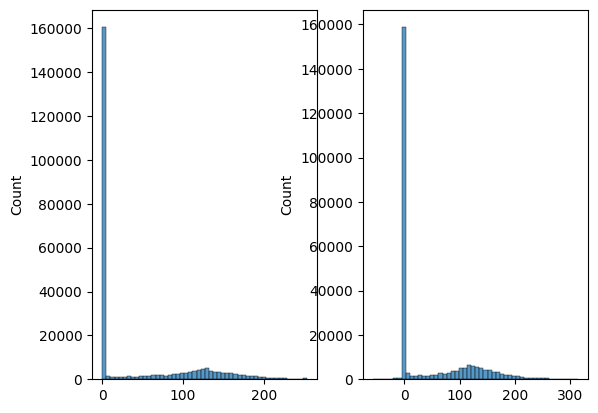

In [28]:
plt.subplot(121)
sns.histplot(blur_moon.ravel(), bins=50)
plt.subplot(122)
sns.histplot(moon_laplace.ravel(), bins=50)

In [29]:
def GaussFunc(K, sigma, s, t):
    return K*np.exp(-0.5*(np.sqrt(s**2 + t**2))**2 / sigma**2)

def Gauss_Filter(img, size, K, sigma):
    # Create matrix Gauss
    x_axis = np.arange(size[0]//2+1)
    y_axis = np.arange(size[1]//2+1)
    matrix_gauss = np.zeros([size[0], size[1]])
    for y in range(0, size[0]):
        for x in range(0, size[1]):
            value = GaussFunc(K, sigma, x_axis[np.abs(size[0]//2-x)], y_axis[np.abs(size[1]//2-y)])
            matrix_gauss[x, y] = value
    print(matrix_gauss)
    matrix_gauss = 1/np.sum(matrix_gauss) * matrix_gauss
    # Create matrix Gauss
    img = Mirror_Padding_v2(img, size[0], size[1])
    m, n = img.shape
    output = np.zeros([m ,n])
    if size[0] % 2 == 0: c1 = 0
    else: c1 = 1
    if size[1] % 2 == 0: c2 = 0
    else: c2 = 1
    for x in range(size[0], m-size[0]):
        for y in range(size[1], n-size[1]):
            elements = img[x-size[0]//2:x+size[0]//2+c1, y-size[1]//2:y+size[1]//2+c2]
            fxy = elements*matrix_gauss
            output[x,y] = np.sum(fxy)
    return output[size[0]:m-size[0], size[1]:n-size[1]]

def Increase_Edge(img, K, size=(5,5), K_gaus=1, sigma=1):
    img_smooth = Gauss_Filter(img, size, K_gaus, sigma)
    gmask = img - img_smooth
    return img + K*gmask

[[0.01831564 0.082085   0.13533528 0.082085   0.01831564]
 [0.082085   0.36787944 0.60653066 0.36787944 0.082085  ]
 [0.13533528 0.60653066 1.         0.60653066 0.13533528]
 [0.082085   0.36787944 0.60653066 0.36787944 0.082085  ]
 [0.01831564 0.082085   0.13533528 0.082085   0.01831564]]


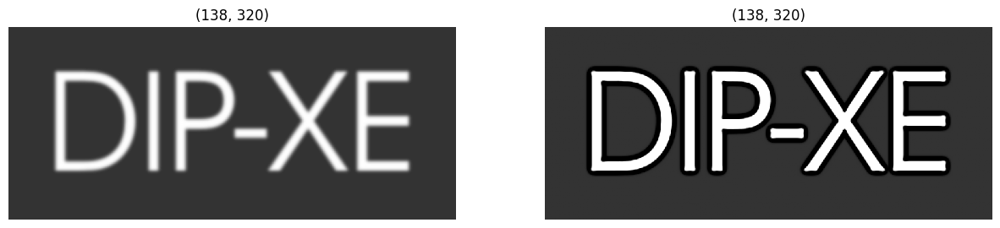

In [30]:
text = plt.imread("dipxe_text.tif")
text_increse = Increase_Edge(text, K=20, size=(5, 5), K_gaus=1, sigma=1)

plt.figure(figsize=(15, 10))

plt.subplot(121)
plt.imshow(text, cmap="gray", vmin=0, vmax=256)
plt.title(text.shape)
plt.axis('off')

plt.subplot(122)
plt.imshow(text_increse, cmap='gray', vmin=0, vmax=256)
plt.title(text_increse.shape)
plt.axis('off')

plt.show()

In [42]:
def Mirror_Padding_v2(img, nx, ny):
    height, width = img.shape
    height_new = height + 2*nx
    width_new = width + 2*ny
    output = np.zeros([height_new, width_new])
    # Center
    output[nx:height_new-nx, ny:width_new-ny] = img
    # Top and Bottom
    output[:nx, ny:width_new-ny] = img[nx-1::-1, :] # Top
    output[height+nx:, ny:width_new-ny] = img[height-1:height-nx-1:-1, :] # Bottom
    # Left and Right
    output[:height_new, :ny] = output[:, 2*ny:ny:-1] # Left
    output[:height_new, width_new-ny:width_new] = output[:, width_new-ny-1:width_new-2*ny-1:-1] # Right
    return output


def local_hist(img, size, C, k0, k1, k2, k3):
    img = Mirror_Padding_v2(img, size[0], size[1])
    mg = np.mean(img)
    sg = np.std(img)
    m, n = img.shape
    output = np.zeros([m ,n])
    for x in range(size[0], m-size[0]):
        for y in range(size[1], n-size[1]):
            elements = img[x-size[0]//2:x+size[0]//2+1, y-size[1]//2:y+size[1]//2+1]
            msy = np.mean(elements)
            ssy = np.std(elements)
            if k0*mg <= msy <= k1*mg or k2*sg <= ssy <= k3*sg:
                output[x,y] = C*img[x,y]
            else:
                output[x,y] = img[x,y]
    return output[size[0]:m-size[0], size[1]:n-size[1]]

In [43]:
vuong_raw = plt.imread("Khoi-hinh-vuong.tif")
vuong_fix = local_hist(vuong_raw, size=(1,1), C=0.05, k0=1, k1=5, k2=1, k3=5)

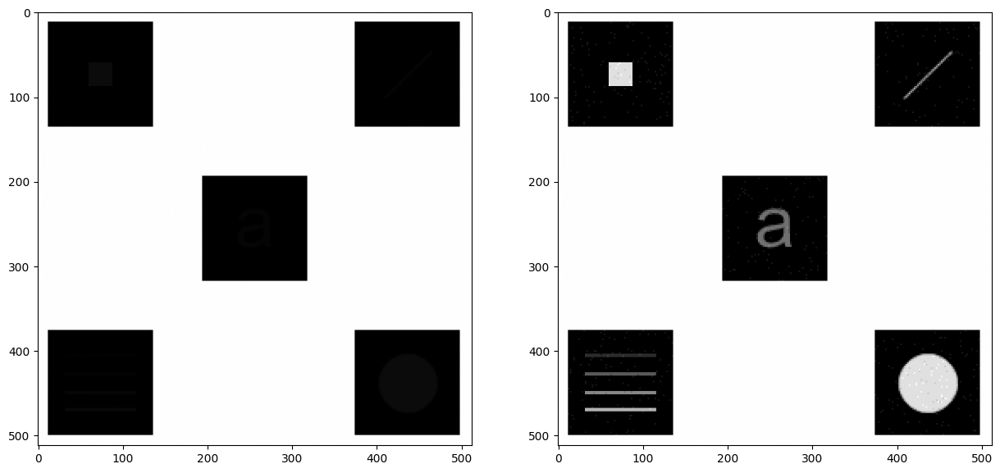

In [44]:
plt.figure(figsize=(15, 10))

plt.subplot(121)
plt.imshow(vuong_raw, cmap='gray')
plt.subplot(122)
plt.imshow(vuong_fix, cmap='gray')

<Axes: ylabel='Count'>

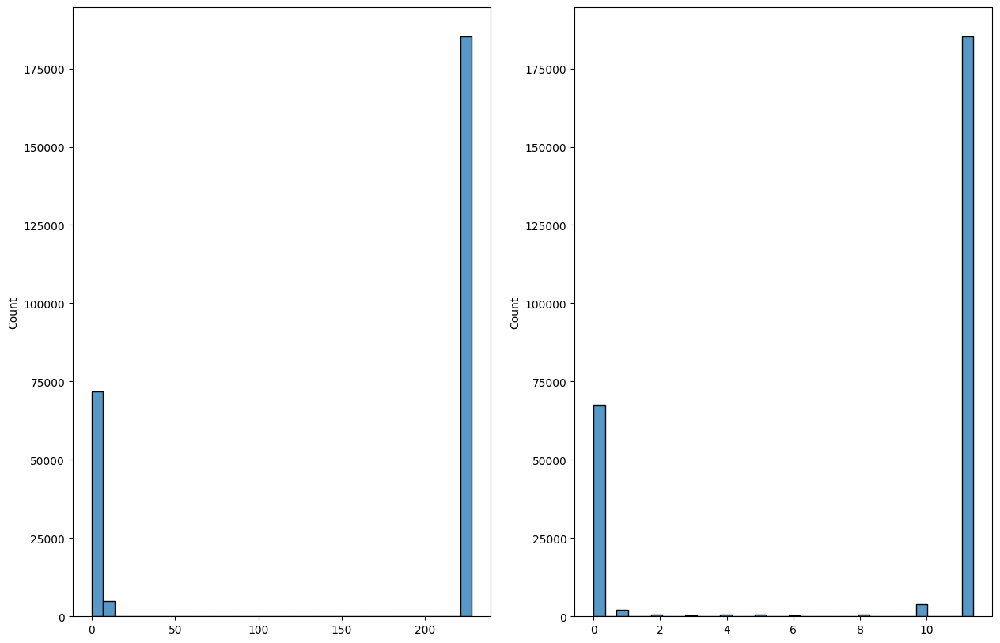

In [45]:
plt.figure(figsize=(15, 10))

plt.subplot(121)
sns.histplot(vuong_raw.ravel())
plt.subplot(122)
sns.histplot(vuong_fix.ravel())


<Axes: >

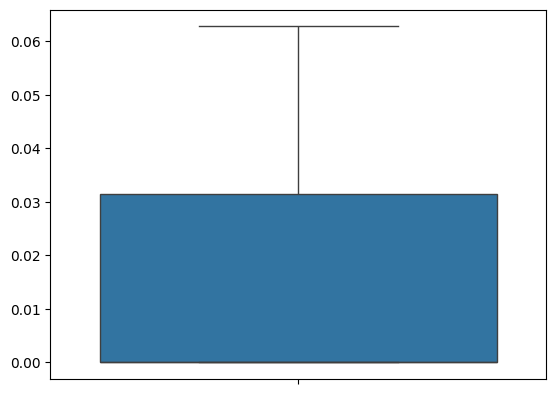

In [46]:
x = (img_test[:,5])

sns.boxplot(x)